Copyright (c) 2014-2019 National Technology and Engineering
Solutions of Sandia, LLC. Under the terms of Contract DE-NA0003525
with National Technology and Engineering Solutions of Sandia, LLC,
the U.S. Government retains certain rights in this software.

Redistribution and use in source and binary forms, with or without
modification, are permitted provided that the following conditions
are met:

1. Redistributions of source code must retain the above copyright
   notice, this list of conditions and the following disclaimer.

2. Redistributions in binary form must reproduce the above copyright
   notice, this list of conditions and the following disclaimer in the
   documentation and/or other materials provided with the distribution.
  
THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS
"AS IS" AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT
LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR
A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT
HOLDER OR CONTRIBUTORS BE LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL,
SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT
LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR SERVICES; LOSS OF USE,
DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY
THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT
(INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE
OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.



# Trajectory Clustering Example

This notebook is an end-to-end example of how to cluster trajectories in Tracktable using distance geometry.  It goes through the following steps:

1.  Read in points from a file.
2.  Assemble those points into trajectories.
3.  Create a distance geometry signature for each trajectory.
4.  Using those signatures as feature vectors, compute clusters using DBSCAN.
5.  Print statistics about each cluster.
6.  Render the resulting clusters onto a map.

Eventually, distance geometry computation will move into the library itself.

In [27]:
# Set up Matplotlib to render in a notebook before anyone else can change its back end.
import matplotlib
%matplotlib inline

In [28]:
from tracktable.domain.feature_vectors import convert_to_feature_vector
from tracktable.core.geomath import point_at_fraction
from tracktable.core.geomath import distance

def distance_geometry_signature(trajectory, 
                                num_control_points=4,
                                normalize_largest_distance=True):
    """Compute an N-point distance geometry signature
    
    Distance geometry is a technique for characterizing a 
    curve in space by measuring the distances between evenly
    spaced points (which we call control points) on the curve.
    This implementation has two parameters: the number of 
    control points and whether to normalize the distances in
    the signature so that the largest distance is always 1.
    
    The number of control points controls the fidelity of the
    resulting signature.  The more control points, the more 
    accurately the features of the curve can be represented,
    but the longer it takes to compute.  
    
    Normalizing the distances allows shape-based comparison 
    between trajectories by taking the dot product of their
    respective distance geometry signatures.  The higher the
    dot product, the more similar the trajectories.  There are
    many possible normalization schemes; this is one we find 
    useful.
    
    Args:
        trajectory (tracktable.domain.<domain>.Trajectory): 
            Trajectory whose signature you want
        num_control_points (integer, default 4): How many 
            points to sample along the trajectory
        normalize_largest_distance (boolean, default True): 
            Whether or not to normalize
        
    Returns:
        tracktable.domain.feature_vectors.FeatureVectorNN where NN is the size of the resulting
           distance geometry signature
    """
    
    control_point_increment = 1.0 / (num_control_points - 1)
    control_point_fractions = [ control_point_increment * i 
                                for i in range(num_control_points) ]
    
    control_points = [ point_at_fraction(trajectory, t) 
                       for t in control_point_fractions ]
    
    # To create the distance geometry signature, first we measure
    # the distance between the first and last control points;
    # then point 0 and point N-1, then point 1 and N; and so on
    # with successively smaller portions of the curve until at last
    # we are measuring the distances between adjacent points.
    
    signature = []
    for stepsize in range(num_control_points-1, 0, -1):
        for start in range(0, num_control_points - stepsize):
            end = start + stepsize
 #           print("DEBUG: Adding distance between points {} and {}".format(start, end))
            signature.append(distance(control_points[start],
                                      control_points[end]))
    
    if normalize_largest_distance:
        largest_distance = max(signature)
        signature = [0 if not largest_distance else d / largest_distance for d in signature ]
#    print("DEBUG: Signature from {} control points has {} elements".format(num_control_points,
#                                                                           len(signature)))
    return convert_to_feature_vector(signature)
            

In [29]:
from tracktable.examples.example_point_reader import configure_point_reader
from tracktable.examples.example_trajectory_builder import configure_trajectory_builder
from tracktable.script_helpers import argument_groups
from tracktable.script_helpers import argparse
from tracktable import domain
import importlib

def load_trajectories(infile,
                      trajectory_domain='terrestrial',
                      separation_distance=100,
                      separation_time=20,
                      minimum_num_points=5,
                      delimiter=',',
                      object_id_column=0,
                      timestamp_column=1,
                      longitude_column=2,
                      latitude_column=3):
    """Load points from a file and convert them to trajectories.
    
    Args:
       infile (file-like object): Source for points
       trajectory_domain (str, default 'terrestrial'): Name of point domain
          (must be 'terrestrial', 'cartesian2d' or 'cartesian3d')
       point_reader_config (dict, default empty): Parameters for the
          point reader, including columns where the coordinates, ID and
          timestamp are found.  See tracktable.examples.example_point_reader
          for details.
       separation_distance(float, default 100): Maximum distance between
          two points in a single trajectory, measured in kilometers
       separation_time (float, default 20): Maximum number of minutes
          between two adjacent points in a single trajectory
       minimum_num_points (int, default 5): Trajectories with fewer
          than this many points will be discarded
    
       You may also specify any of the following keyword arguments to be 
       passed to the point reader:
    
       delimiter (character, default ','): Delimiter for column in point file
       object_id_column (int, default 0): Which column in the point file contains the object ID
       timestamp_column (int, default 1): Which column in the point file contains the timestamp
       longitude_column (int, default 2): Which column in the point file contains longitude
       latitude_column (int, default 3): Which column in the point file contains latitude
       
    Returns:
       Iterable of trajectories.  You will probably want to put this 
       into a list.
    """

    domain_module = importlib.import_module('tracktable.domain.{}'.format(trajectory_domain))
    reader_type = domain_module.TrajectoryPointReader
    reader = reader_type()
    
    reader.input = infile
    reader.object_id_column = object_id_column
    reader.timestamp_column = timestamp_column
    reader.longitude_column = longitude_column
    reader.latitude_column = latitude_column
    reader.delimiter = delimiter
    
   
    trajectory_builder = configure_trajectory_builder(separation_distance=separation_distance,
                                                      separation_time=separation_time,
                                                      minimum_length=minimum_num_points)
    trajectory_builder.input = reader
    return trajectory_builder 

## Cluster Label Computation

This next section is where the clustering algorithm actually runs.

In [30]:
import os.path
from tracktable.analysis.dbscan import compute_cluster_labels

# You can set your own point source here
point_filename = os.path.expanduser("~/tracktable/tracktable/Python/tracktable/examples/data/april_04_2013.csv")

# Set any parameters you want on the trajectory builder here
with open(point_filename, 'r') as infile:
    all_trajectories = list(load_trajectories(infile))
    
num_control_points = 4
feature_vectors = [ distance_geometry_signature(trajectory,
                                                num_control_points=num_control_points)
                    for trajectory in all_trajectories
                  ]

# DBSCAN needs two parameters.  The first is the size of the 
# box that defines when two points are close enough to one another
# to belong to the same cluster.  The second is the minimum number
# of points in a cluster.
signature_length = len(feature_vectors[0])

# This is a default search box size.  You can certainly do better.
# You know your data better than we do.
search_box_half_span = [0.01] * signature_length
minimum_cluster_size = 5

cluster_labels = compute_cluster_labels(feature_vectors,
                                        search_box_half_span,
                                        minimum_cluster_size) 


INFO: Trajectory assembly: New trajectories will be declared after a separation of 100.0 units or 0:20:00 seconds.
INFO: Trajectories with fewer than 5 points will be rejected.
(1) STATUS: 100 trajectories announced and 5 discarded for having fewer than 5 points
(1) STATUS: 200 trajectories announced and 7 discarded for having fewer than 5 points
(1) STATUS: 300 trajectories announced and 8 discarded for having fewer than 5 points
(1) STATUS: 400 trajectories announced and 11 discarded for having fewer than 5 points
(1) STATUS: 500 trajectories announced and 16 discarded for having fewer than 5 points
(1) STATUS: 600 trajectories announced and 20 discarded for having fewer than 5 points
(1) STATUS: 700 trajectories announced and 24 discarded for having fewer than 5 points
(1) STATUS: 800 trajectories announced and 30 discarded for having fewer than 5 points
(1) STATUS: 900 trajectories announced and 70 discarded for having fewer than 5 points
(1) STATUS: 1000 trajectories announced and

(3) STATUS: 9100 trajectories announced and 287 discarded for having fewer than 5 points
(3) STATUS: 9200 trajectories announced and 287 discarded for having fewer than 5 points
(3) STATUS: 9300 trajectories announced and 288 discarded for having fewer than 5 points
(3) STATUS: 9400 trajectories announced and 288 discarded for having fewer than 5 points
(3) STATUS: 9500 trajectories announced and 288 discarded for having fewer than 5 points
(3) STATUS: 9600 trajectories announced and 289 discarded for having fewer than 5 points
(3) STATUS: 9700 trajectories announced and 290 discarded for having fewer than 5 points
(3) STATUS: 9800 trajectories announced and 290 discarded for having fewer than 5 points
(3) STATUS: 9900 trajectories announced and 290 discarded for having fewer than 5 points
(3) STATUS: 10000 trajectories announced and 292 discarded for having fewer than 5 points
(3) STATUS: 10100 trajectories announced and 292 discarded for having fewer than 5 points
(3) STATUS: 10200 t

(3) STATUS: 18200 trajectories announced and 689 discarded for having fewer than 5 points
(3) STATUS: 18300 trajectories announced and 689 discarded for having fewer than 5 points
(3) STATUS: 18400 trajectories announced and 692 discarded for having fewer than 5 points
(3) STATUS: 18500 trajectories announced and 695 discarded for having fewer than 5 points
(3) STATUS: 18600 trajectories announced and 696 discarded for having fewer than 5 points
(3) STATUS: 18700 trajectories announced and 698 discarded for having fewer than 5 points
(4) STATUS: 18726 trajectories announced and 700 discarded for having fewer than 5 points
(3) STATUS: 18800 trajectories announced and 701 discarded for having fewer than 5 points
(3) STATUS: 18900 trajectories announced and 704 discarded for having fewer than 5 points
(3) STATUS: 19000 trajectories announced and 706 discarded for having fewer than 5 points
(3) STATUS: 19100 trajectories announced and 706 discarded for having fewer than 5 points
(3) STATUS

(2) STATUS: 27930 trajectories announced and 2000 discarded for having fewer than 5 points
(2) STATUS: 27996 trajectories announced and 2100 discarded for having fewer than 5 points
(1) STATUS: 28000 trajectories announced and 2106 discarded for having fewer than 5 points
(3) STATUS: 28100 trajectories announced and 2106 discarded for having fewer than 5 points
(3) STATUS: 28200 trajectories announced and 2114 discarded for having fewer than 5 points
(3) STATUS: 28300 trajectories announced and 2119 discarded for having fewer than 5 points
(3) STATUS: 28400 trajectories announced and 2122 discarded for having fewer than 5 points
(3) STATUS: 28500 trajectories announced and 2125 discarded for having fewer than 5 points
(3) STATUS: 28600 trajectories announced and 2130 discarded for having fewer than 5 points
(3) STATUS: 28700 trajectories announced and 2141 discarded for having fewer than 5 points
(3) STATUS: 28800 trajectories announced and 2150 discarded for having fewer than 5 points

(2) STATUS: 36488 trajectories announced and 4300 discarded for having fewer than 5 points
(1) STATUS: 36500 trajectories announced and 4376 discarded for having fewer than 5 points
(2) STATUS: 36505 trajectories announced and 4400 discarded for having fewer than 5 points
(2) STATUS: 36534 trajectories announced and 4500 discarded for having fewer than 5 points
(2) STATUS: 36554 trajectories announced and 4600 discarded for having fewer than 5 points
(2) STATUS: 36578 trajectories announced and 4700 discarded for having fewer than 5 points
(1) STATUS: 36600 trajectories announced and 4763 discarded for having fewer than 5 points
(2) STATUS: 36608 trajectories announced and 4800 discarded for having fewer than 5 points
(2) STATUS: 36630 trajectories announced and 4900 discarded for having fewer than 5 points
(2) STATUS: 36660 trajectories announced and 5000 discarded for having fewer than 5 points
(2) STATUS: 36689 trajectories announced and 5100 discarded for having fewer than 5 points

(2) STATUS: 42750 trajectories announced and 7200 discarded for having fewer than 5 points
(1) STATUS: 42800 trajectories announced and 7280 discarded for having fewer than 5 points
(2) STATUS: 42825 trajectories announced and 7300 discarded for having fewer than 5 points
(1) STATUS: 42900 trajectories announced and 7392 discarded for having fewer than 5 points
(2) STATUS: 42909 trajectories announced and 7400 discarded for having fewer than 5 points
(1) STATUS: 43000 trajectories announced and 7475 discarded for having fewer than 5 points
(3) STATUS: 43100 trajectories announced and 7478 discarded for having fewer than 5 points
(3) STATUS: 43200 trajectories announced and 7479 discarded for having fewer than 5 points
(3) STATUS: 43300 trajectories announced and 7481 discarded for having fewer than 5 points
(3) STATUS: 43400 trajectories announced and 7482 discarded for having fewer than 5 points
(3) STATUS: 43500 trajectories announced and 7482 discarded for having fewer than 5 points

(3) STATUS: 52100 trajectories announced and 8835 discarded for having fewer than 5 points
(3) STATUS: 52200 trajectories announced and 8841 discarded for having fewer than 5 points
(3) STATUS: 52300 trajectories announced and 8845 discarded for having fewer than 5 points
(3) STATUS: 52400 trajectories announced and 8848 discarded for having fewer than 5 points
(3) STATUS: 52500 trajectories announced and 8856 discarded for having fewer than 5 points
(1) STATUS: 52600 trajectories announced and 8879 discarded for having fewer than 5 points
(1) STATUS: 52700 trajectories announced and 8883 discarded for having fewer than 5 points
(1) STATUS: 52800 trajectories announced and 8891 discarded for having fewer than 5 points
(1) STATUS: 52900 trajectories announced and 8892 discarded for having fewer than 5 points
(1) STATUS: 53000 trajectories announced and 8893 discarded for having fewer than 5 points
(2) STATUS: 53065 trajectories announced and 8900 discarded for having fewer than 5 points

(2) STATUS: 61759 trajectories announced and 10100 discarded for having fewer than 5 points
(1) STATUS: 61800 trajectories announced and 10147 discarded for having fewer than 5 points
(2) STATUS: 61856 trajectories announced and 10200 discarded for having fewer than 5 points
(1) STATUS: 61900 trajectories announced and 10232 discarded for having fewer than 5 points
(1) STATUS: 62000 trajectories announced and 10298 discarded for having fewer than 5 points
(3) STATUS: 62100 trajectories announced and 10299 discarded for having fewer than 5 points
(3) STATUS: 62200 trajectories announced and 10299 discarded for having fewer than 5 points
(4) STATUS: 62211 trajectories announced and 10300 discarded for having fewer than 5 points
(3) STATUS: 62300 trajectories announced and 10301 discarded for having fewer than 5 points
(3) STATUS: 62400 trajectories announced and 10303 discarded for having fewer than 5 points
(3) STATUS: 62500 trajectories announced and 10304 discarded for having fewer th

(1) STATUS: 70900 trajectories announced and 11059 discarded for having fewer than 5 points
(1) STATUS: 71000 trajectories announced and 11060 discarded for having fewer than 5 points
(1) STATUS: 71100 trajectories announced and 11063 discarded for having fewer than 5 points
(1) STATUS: 71200 trajectories announced and 11067 discarded for having fewer than 5 points
(1) STATUS: 71300 trajectories announced and 11070 discarded for having fewer than 5 points
(1) STATUS: 71400 trajectories announced and 11074 discarded for having fewer than 5 points
(1) STATUS: 71500 trajectories announced and 11076 discarded for having fewer than 5 points
(1) STATUS: 71600 trajectories announced and 11078 discarded for having fewer than 5 points
(1) STATUS: 71700 trajectories announced and 11080 discarded for having fewer than 5 points
(1) STATUS: 71800 trajectories announced and 11084 discarded for having fewer than 5 points
(2) STATUS: 71888 trajectories announced and 11100 discarded for having fewer th

(3) STATUS: 82100 trajectories announced and 12266 discarded for having fewer than 5 points
(3) STATUS: 82200 trajectories announced and 12266 discarded for having fewer than 5 points
(3) STATUS: 82300 trajectories announced and 12267 discarded for having fewer than 5 points
(3) STATUS: 82400 trajectories announced and 12269 discarded for having fewer than 5 points
(3) STATUS: 82500 trajectories announced and 12272 discarded for having fewer than 5 points
(3) STATUS: 82600 trajectories announced and 12276 discarded for having fewer than 5 points
(3) STATUS: 82700 trajectories announced and 12276 discarded for having fewer than 5 points
(3) STATUS: 82800 trajectories announced and 12277 discarded for having fewer than 5 points
(3) STATUS: 82900 trajectories announced and 12279 discarded for having fewer than 5 points
(3) STATUS: 83000 trajectories announced and 12279 discarded for having fewer than 5 points
(3) STATUS: 83100 trajectories announced and 12279 discarded for having fewer th

Testing for point decoration.  First point: (1, 0.569981, 0.814227, 0.202716, 0.379407, 0.435123)
DEBUG: Points are not decorated.


## Cluster Statistics

In [31]:
# Assemble each cluster as a list of its component trajectories.
clusters = {}
for (vertex_id, cluster_id) in cluster_labels:
    if cluster_id not in clusters:
        clusters[cluster_id] = [all_trajectories[vertex_id]]
    else:
        clusters[cluster_id].append(all_trajectories[vertex_id])

def cluster_name(cid):
    if cid == 0:
        return 'Outliers'
    else:
        return 'Cluster {}'.format(cid)
    
print("RESULT: Cluster sizes:")
for (cid, cluster) in clusters.items():
    print("{}: {}".format(cluster_name(cid),
                          len(cluster)))


RESULT: Cluster sizes:
Cluster 1: 84228
Outliers: 12352
Cluster 2: 7
Cluster 3: 8
Cluster 4: 8
Cluster 5: 32
Cluster 6: 5
Cluster 7: 10
Cluster 60: 5
Cluster 17: 5
Cluster 8: 10
Cluster 9: 6
Cluster 82: 5
Cluster 49: 4
Cluster 10: 5
Cluster 45: 5
Cluster 35: 7
Cluster 28: 5
Cluster 69: 5
Cluster 11: 15
Cluster 12: 25
Cluster 40: 6
Cluster 55: 5
Cluster 52: 7
Cluster 14: 5
Cluster 13: 9
Cluster 15: 4
Cluster 16: 3
Cluster 81: 6
Cluster 18: 6
Cluster 19: 6
Cluster 20: 2
Cluster 54: 16
Cluster 34: 19
Cluster 33: 4
Cluster 21: 15
Cluster 39: 6
Cluster 22: 7
Cluster 38: 3
Cluster 23: 40
Cluster 24: 19
Cluster 25: 2
Cluster 26: 3
Cluster 63: 5
Cluster 42: 6
Cluster 27: 7
Cluster 58: 5
Cluster 68: 4
Cluster 83: 5
Cluster 29: 5
Cluster 30: 7
Cluster 85: 4
Cluster 31: 8
Cluster 32: 4
Cluster 76: 5
Cluster 43: 5
Cluster 75: 5
Cluster 61: 5
Cluster 73: 8
Cluster 84: 5
Cluster 37: 5
Cluster 50: 4
Cluster 46: 9
Cluster 36: 5
Cluster 53: 5
Cluster 41: 4
Cluster 44: 9
Cluster 78: 3
Cluster 47: 5
Clus

## Cluster Visualization

/ascldap/users/kjward/anaconda3/envs/jupyter/lib/python3.7/site-packages/tracktable/render/maps.py:320: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  mymap = Basemap(**map_parameters)
/ascldap/users/kjward/anaconda3/envs/jupyter/lib/python3.7/site-packages/tracktable/render/maps.py:560: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  return [ mymap.drawcountries(color=color, linewidth=linewidth, zorder=zorder) ]
/ascldap/users/kjward/anaconda3/envs/jupyter/lib/python3.7/site-packages/tracktable/render/maps.py:569: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  return [ mymap.drawstates(color=color, linewidth=linewidth, zorder=zorder) ]


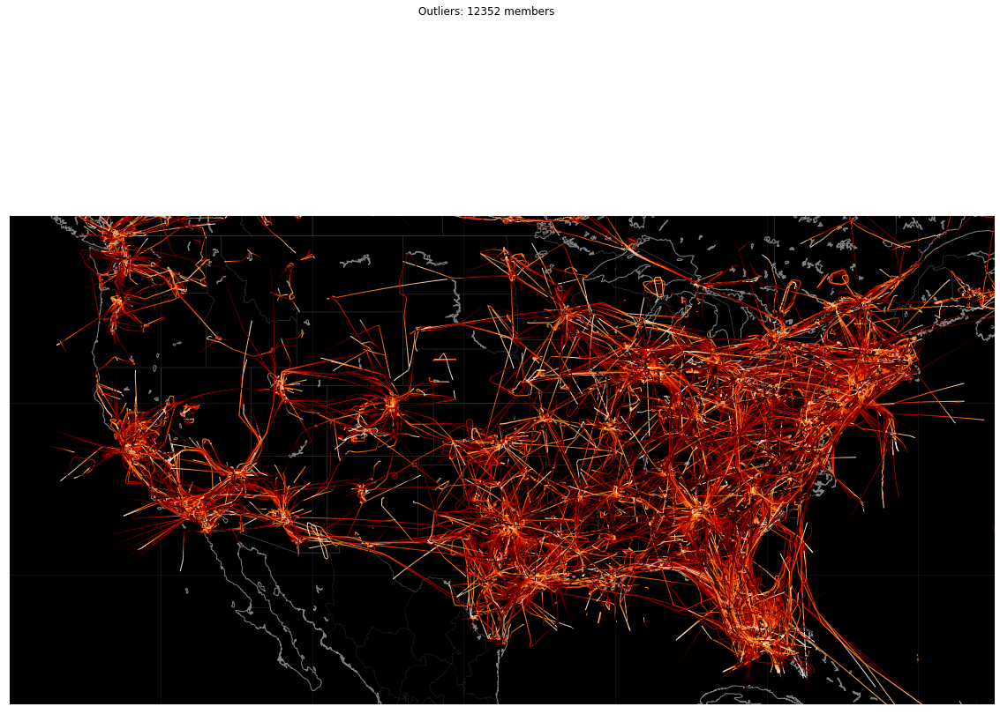

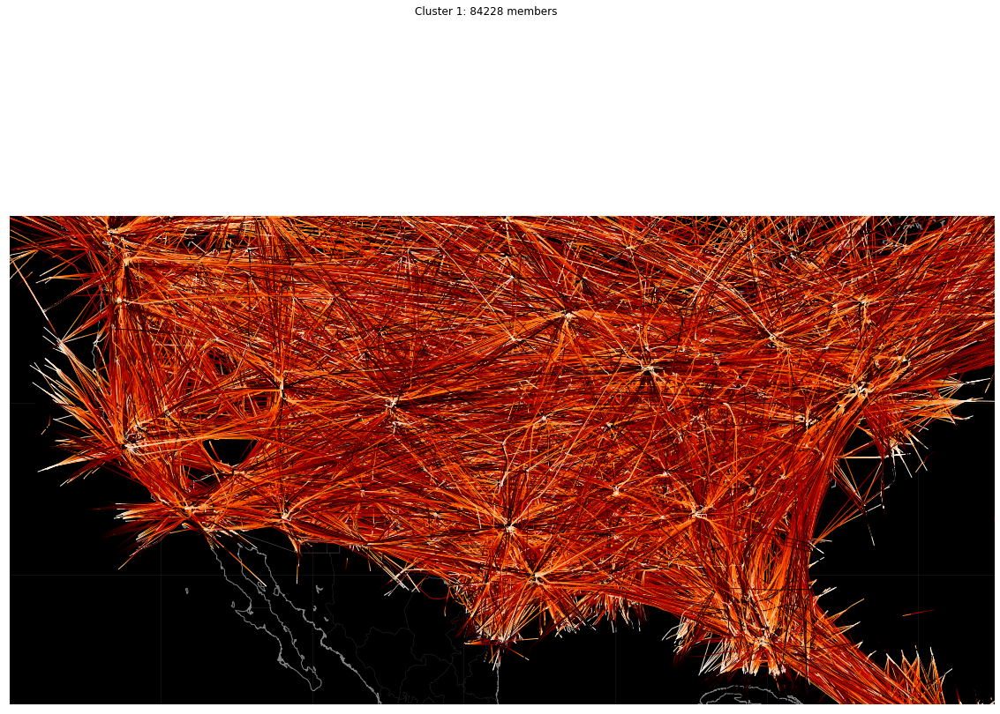

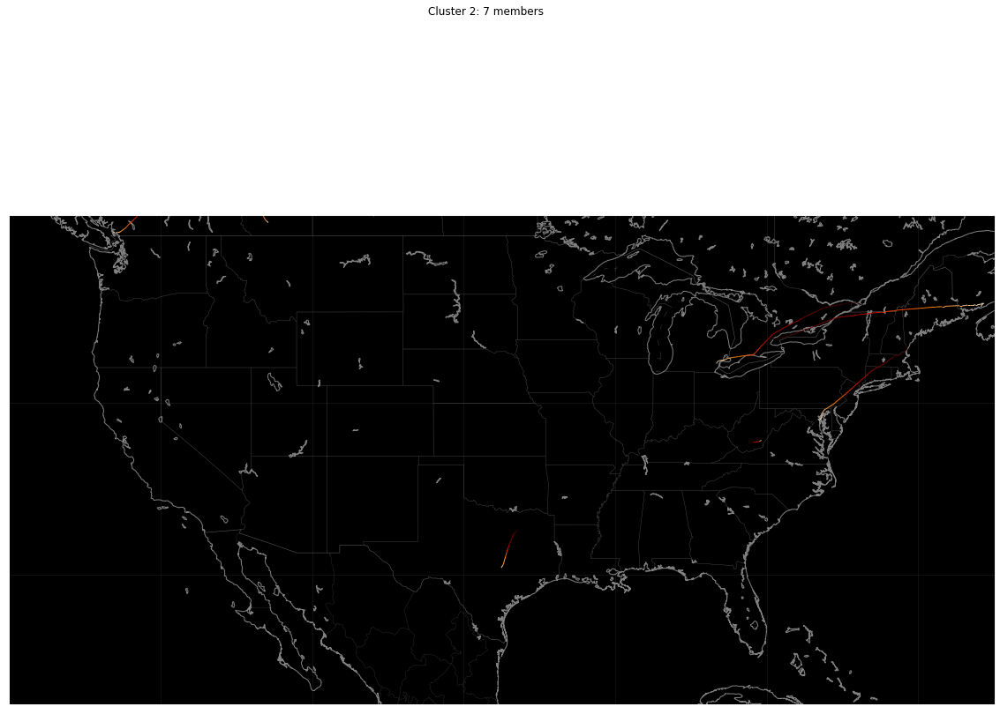

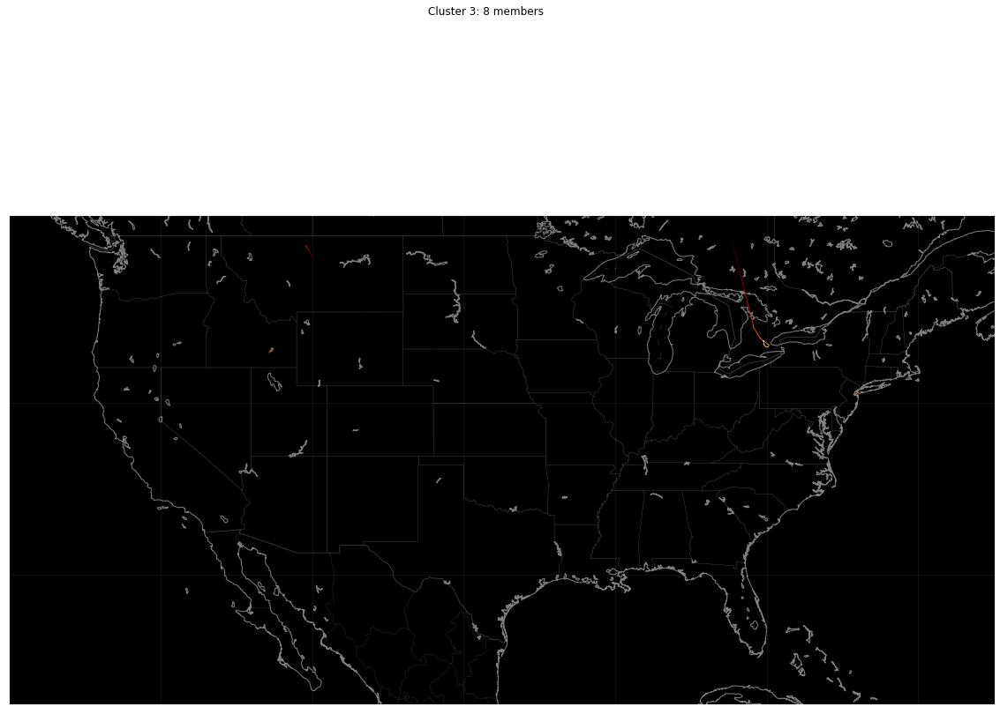

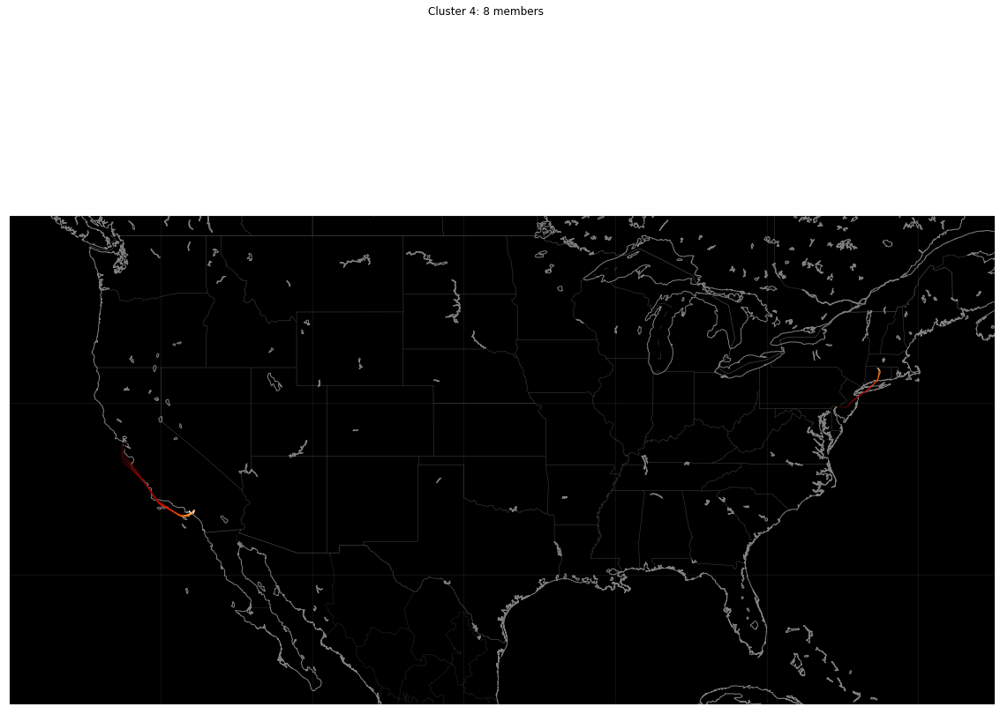

...

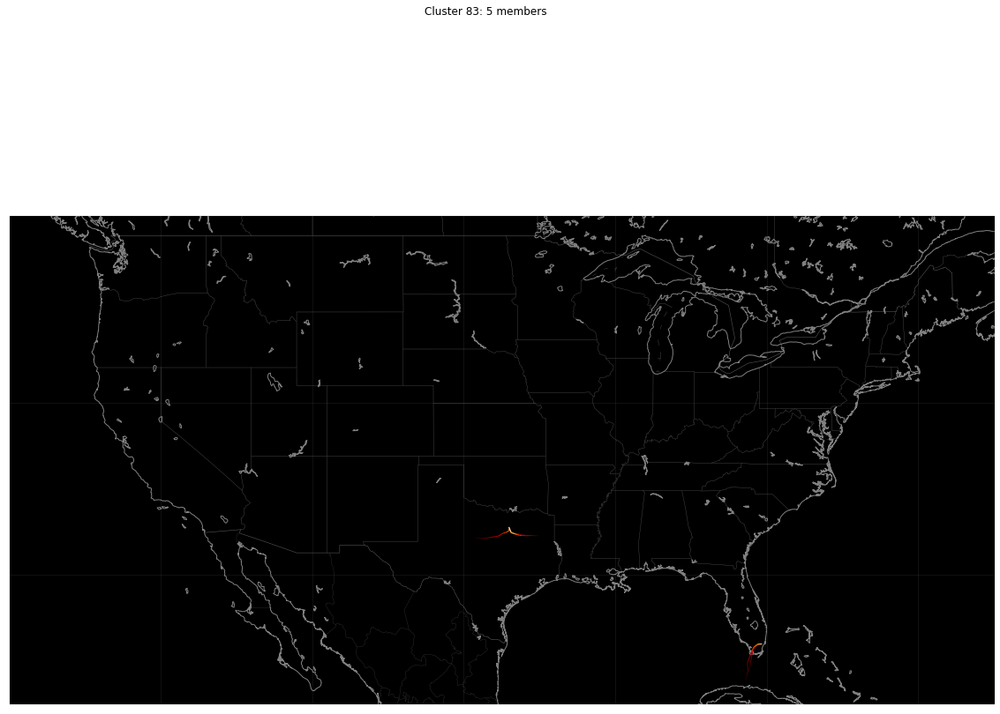

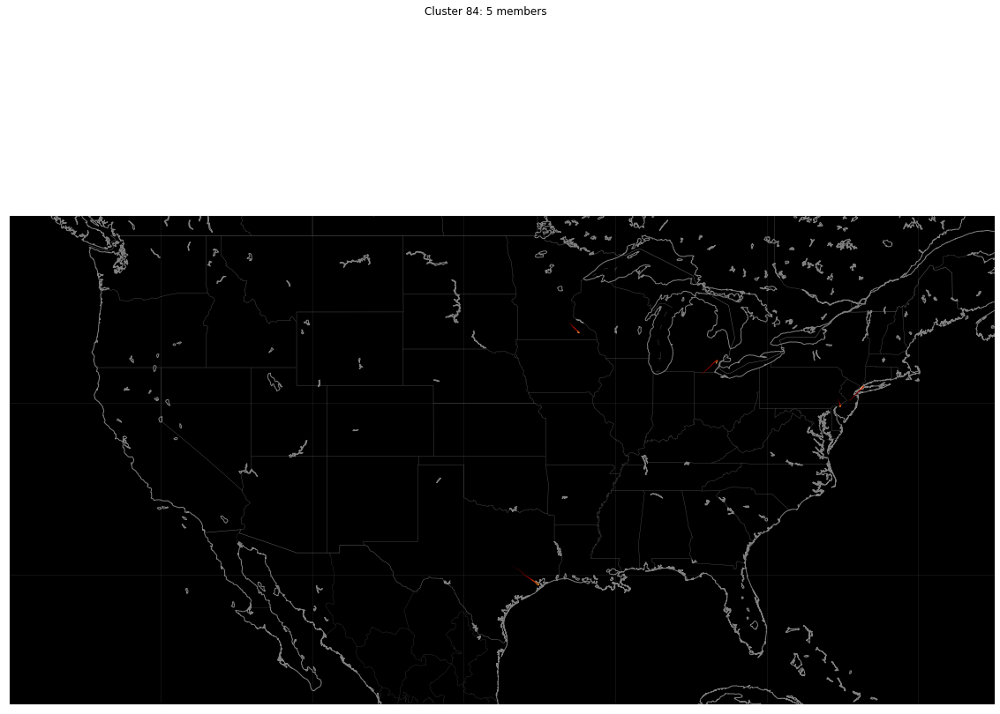

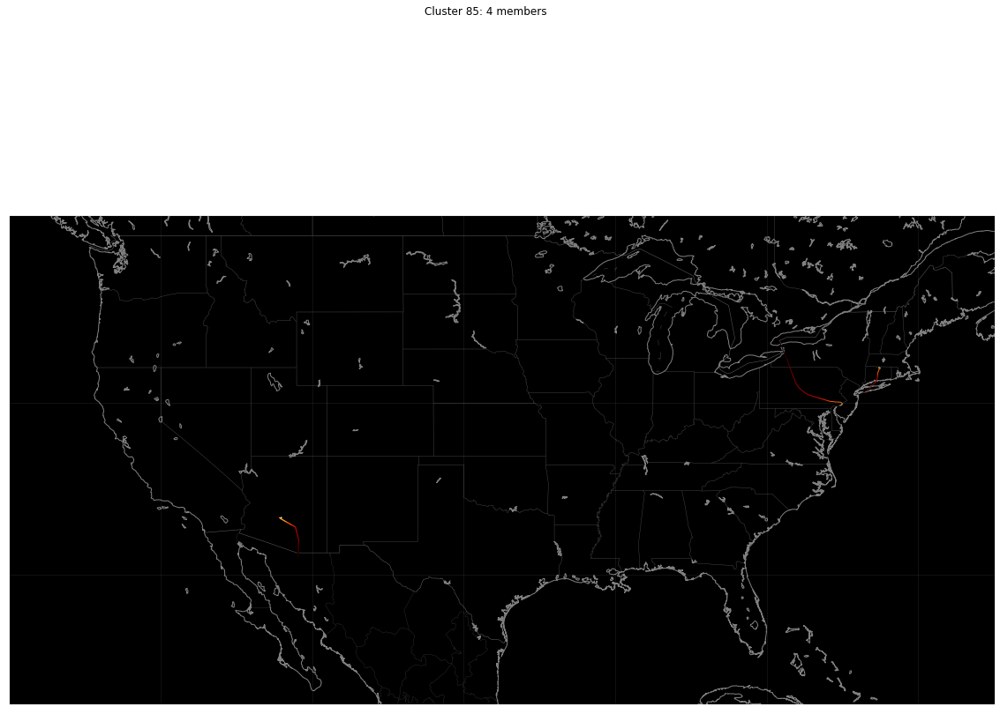

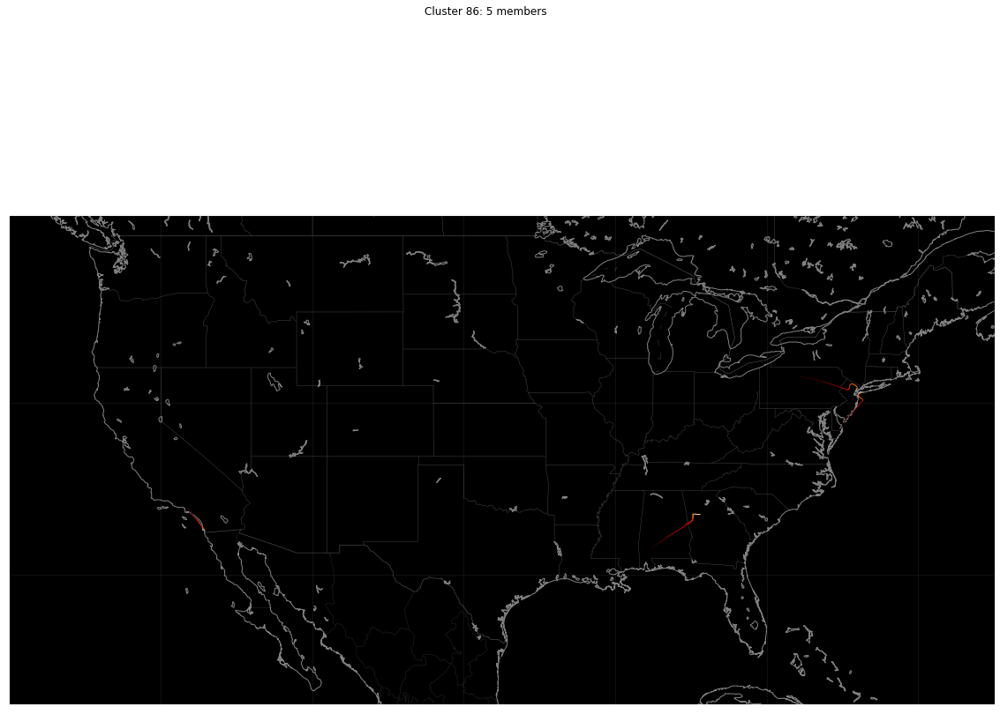

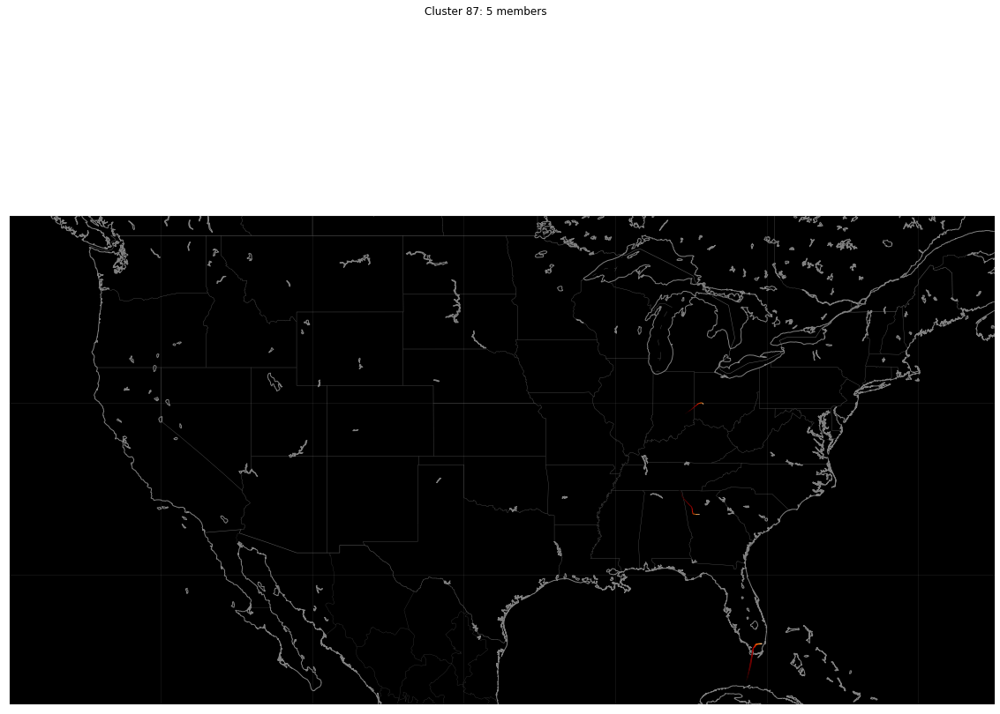

In [34]:
#from tracktable.examples.trajectory_map_from_points import initialize_matplotlib_figure
from tracktable.examples.example_trajectory_rendering import render_trajectories
from tracktable.domain import terrestrial
from tracktable.render import mapmaker
from matplotlib import pyplot

sorted_ids = sorted(clusters.keys())

for cluster_id in sorted_ids:
    # Set up the canvas and map projection
    figure = pyplot.figure(figsize=[20, 15])
    axes = figure.add_subplot(1, 1, 1)
    #(figure, axes) = initialize_matplotlib_figure([10, 7.5])
    (mymap, map_actors) = mapmaker.mapmaker(domain='terrestrial',
                                            map_name='conus')

    render_trajectories(mymap, clusters[cluster_id], trajectory_linewidth=1)
    figure.suptitle('{}: {} members'.format(
       cluster_name(cluster_id),
       len(clusters[cluster_id])))
    pyplot.show()